# Librareis
import libraries

In [2]:
import seaborn as sns 
import matplotlib.pyplot as plt 
import numpy as np 
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
import pandas as pd 



let's first put together all the data sets 

In [3]:
dfs=[]
for year in range(2010,2020):
    dfs.append(pd.read_csv('C:\\Users\\alise\\Dropbox\\Programming\\Machine learning in physics\\Project\\Success in movies\\Machine-learning-in-physics-Project\\Phase 1-Data Collection\\Data\\Yearly data sets\\%s.csv'%year,index_col=0))
meta=pd.concat(dfs,ignore_index=True)

In [4]:
meta.columns

Index(['IMDB ID', 'Mojo ID', 'title', 'Genres', 'Year', 'Domestic Gross ($)',
       'Worldwide Gross ($)', 'Opening ($)', 'Budget', 'Opening Theaters',
       'Release Date', 'MPAA', 'In Realease (Days)', 'Widest Release', 'Stars',
       'Director(s)', 'Writer(s)', 'Producer(s)', 'Running time (min)',
       'IMDB score', 'IMDB votes', 'Metascore', 'Meta Users', 'Country',
       'Language', 'Distributor', 'Plot Outline'],
      dtype='object')

In [6]:
meta.head(5)

,IMDB ID,Mojo ID,title,Genres,Year,Domestic Gross ($),Worldwide Gross ($),Opening ($),Budget,Opening Theaters,...,Producer(s),Running time (min),IMDB score,IMDB votes,Metascore,Meta Users,Country,Language,Distributor,Plot Outline
0,tt0499549,876971521,Avatar,Action\n \n Adventure\n \n ...,2011.0,749766139.0,2.744337e+09,77025481.0,237000000.0,3452.0,...,Brooke Breton\n James Cameron\n Laeta Kalogrid...,162.0,7.8,1122762.0,83.0,"3,483 user\n536 critic\n",USA,English,Twentieth Century Fox,A paraplegic Marine dispatched to the moon Pan...
1,tt0435761,1383564801,Toy Story 3,Adventure\n \n Animation\n \n ...,2011.0,415004880.0,1.066970e+09,110307189.0,200000000.0,4028.0,...,Darla K. Anderson\n John Lasseter\n Nicole Par...,103.0,8.2,760723.0,92.0,912 user\n479 critic\n,USA,English,Walt Disney Studios Motion Pictures,The toys are mistakenly delivered to a day-car...
2,tt1014759,3393226241,Alice in Wonderland,Adventure\n \n Family\n \n ...,2011.0,334191110.0,1.025467e+09,116101023.0,200000000.0,3728.0,...,Katterli Frauenfelder\n Derek Frey\n Chris Leb...,108.0,6.4,385498.0,53.0,802 user\n459 critic\n,USA\nUK,English,Walt Disney Studios Motion Pictures,Nineteen-year-old Alice returns to the magical...
3,tt1228705,1515881985,Iron Man 2,Action\n \n Adventure\n \n ...,2011.0,312433331.0,6.239333e+08,128122480.0,200000000.0,4380.0,...,Victoria Alonso\n Louis D'Esposito\n Susan Dow...,124.0,7.0,726620.0,57.0,912 user\n498 critic\n,USA,English,Paramount Pictures,With the world now aware of his identity as Ir...
4,tt1325004,659654145,The Twilight Saga: Eclipse,Action\n \n Adventure\n \n ...,2011.0,300531751.0,6.984913e+08,64832191.0,68000000.0,4468.0,...,Bill Bannerman\n Marty Bowen\n Wyck Godfrey\n ...,124.0,5.0,229133.0,58.0,528 user\n294 critic\n,USA,English,Summit Entertainment,As a string of mysterious killings grips Seatt...


In [ ]:
Now lets look at the correlations between different features 

In [9]:
feature1=['Domestic Gross ($)','Worldwide Gross ($)','Opening ($)','Budget','Opening Theaters','In Realease (Days)','Running time (min)','IMDB score','IMDB votes','Metascore']
meta[feature1]

,Domestic Gross ($),Worldwide Gross ($),Opening ($),Budget,Opening Theaters,In Realease (Days),Running time (min),IMDB score,IMDB votes,Metascore
0,749766139.0,2.744337e+09,77025481.0,237000000.0,3452.0,379.0,162.0,7.8,1122762.0,83.0
1,415004880.0,1.066970e+09,110307189.0,200000000.0,4028.0,203.0,103.0,8.2,760723.0,92.0
2,334191110.0,1.025467e+09,116101023.0,200000000.0,3728.0,302.0,108.0,6.4,385498.0,53.0
3,312433331.0,6.239333e+08,128122480.0,200000000.0,4380.0,239.0,124.0,7.0,726620.0,57.0
4,300531751.0,6.984913e+08,64832191.0,68000000.0,4468.0,185.0,124.0,5.0,229133.0,58.0
...,...,...,...,...,...,...,...,...,...,...
8398,10389.0,1.156800e+04,183.0,NaN,1.0,397.0,NaN,7.5,11.0,NaN
8399,8132.0,8.132000e+03,1125.0,NaN,1.0,1952.0,115.0,7.4,655.0,NaN
8400,18236.0,1.823600e+04,418.0,NaN,1.0,1670.0,87.0,8.0,159.0,NaN
8401,6201.0,6.201000e+03,1576.0,NaN,2.0,2238.0,130.0,7.2,641.0,92.0


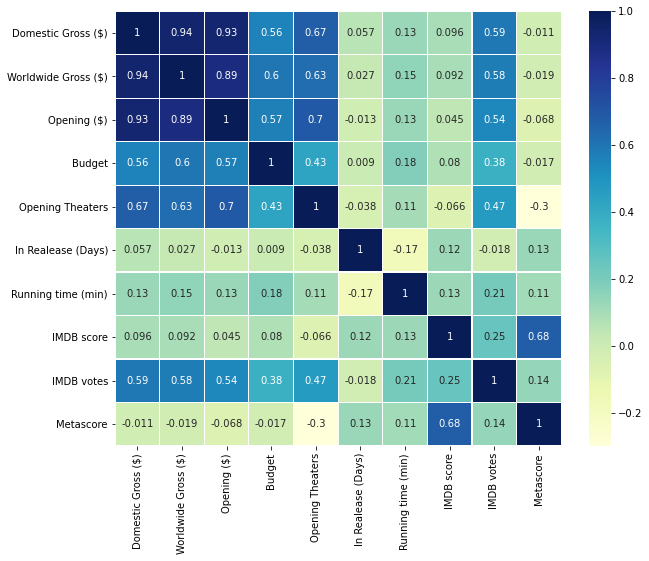

In [10]:
fig=plt.figure(figsize=(10,8))
sns.heatmap(meta[feature1].corr(), cmap='YlGnBu', annot=True, linewidths = 0.2)

Now let's look at the distribution of the worldwide Gross

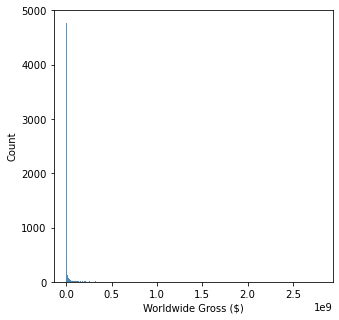

In [11]:
fig=plt.figure(figsize=(5,5))
sns.histplot(meta['Worldwide Gross ($)'])
plt.show()

As you can see the the resaults are not very clear because of high number of low sales movies. For better visualization let's look at the logarithmic plot

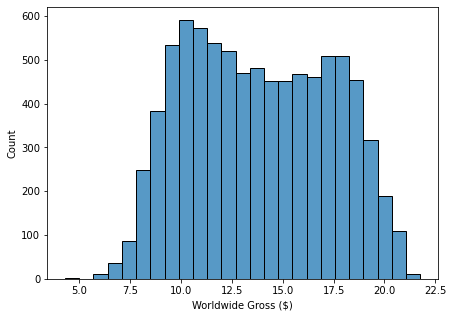

In [13]:
log_gross=np.log1p(meta['Worldwide Gross ($)'])
fig=plt.figure(figsize=(7,5))
sns.histplot(log_gross,bins=25)
plt.show()

In [ ]:
Budget vs worldwide gross 

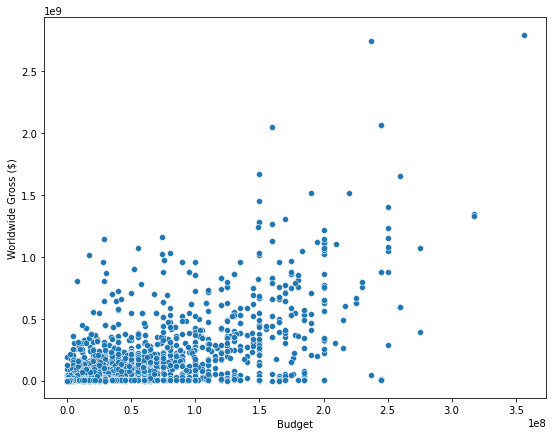

In [14]:
fig=plt.figure(figsize=(9,7))
sns.scatterplot(x=meta['Budget'],y=meta['Worldwide Gross ($)'])
plt.show()

In [15]:
sample =  meta.sample(1000)[feature1]
sample['Domestic Gross ($)']=np.log1p(sample['Domestic Gross ($)'])

In [17]:
sample['Worldwide Gross ($)']=np.log1p(sample['Worldwide Gross ($)'])
sample['Opening ($)']=np.log1p(sample['Opening ($)'])
sample['Budget']=np.log1p(sample['Budget'])

In [21]:
sam

,Domestic Gross ($),Worldwide Gross ($),Opening ($),Budget,Opening Theaters,In Realease (Days),Running time (min),IMDB score,IMDB votes
7465,17.731294,18.663328,16.760023,18.315320,3460.0,105.0,123.0,6.5,201030.0
1447,17.707508,18.162295,16.498147,16.906553,3391.0,154.0,94.0,6.3,22325.0
1756,11.945941,14.116464,10.234875,NaN,5.0,186.0,111.0,5.7,729.0
3891,18.352791,19.158015,17.312871,19.062535,3972.0,224.0,130.0,6.4,172755.0
5837,13.770436,14.819243,10.675769,NaN,5.0,98.0,88.0,7.4,19784.0
...,...,...,...,...,...,...,...,...,...
3724,9.623972,9.623972,7.921173,11.813037,2.0,868.0,89.0,5.9,47.0
1475,17.372990,18.760510,16.277806,17.312018,2567.0,158.0,99.0,6.4,53885.0
7196,9.778321,9.805378,8.144389,14.508658,1.0,312.0,102.0,7.5,3613.0
4901,15.062346,17.239503,10.907954,NaN,9.0,458.0,116.0,7.7,47882.0


In [32]:
sample=sample.rename(columns={'Domestic Gross ($)':'log(Domestic Gross ($))','Worldwide Gross ($)':'log(Worldwide Gross ($))','Opening ($)':'log(Opening ($))','Budget':'log(Budget)'})

In [33]:
sample

,log(Domestic Gross ($)),log(Worldwide Gross ($)),log(Opening ($)),log(Budget),Opening Theaters,In Realease (Days),Running time (min),IMDB score,IMDB votes
7465,17.731294,18.663328,16.760023,18.315320,3460.0,105.0,123.0,6.5,201030.0
1447,17.707508,18.162295,16.498147,16.906553,3391.0,154.0,94.0,6.3,22325.0
1756,11.945941,14.116464,10.234875,NaN,5.0,186.0,111.0,5.7,729.0
3891,18.352791,19.158015,17.312871,19.062535,3972.0,224.0,130.0,6.4,172755.0
5837,13.770436,14.819243,10.675769,NaN,5.0,98.0,88.0,7.4,19784.0
...,...,...,...,...,...,...,...,...,...
3724,9.623972,9.623972,7.921173,11.813037,2.0,868.0,89.0,5.9,47.0
1475,17.372990,18.760510,16.277806,17.312018,2567.0,158.0,99.0,6.4,53885.0
7196,9.778321,9.805378,8.144389,14.508658,1.0,312.0,102.0,7.5,3613.0
4901,15.062346,17.239503,10.907954,NaN,9.0,458.0,116.0,7.7,47882.0


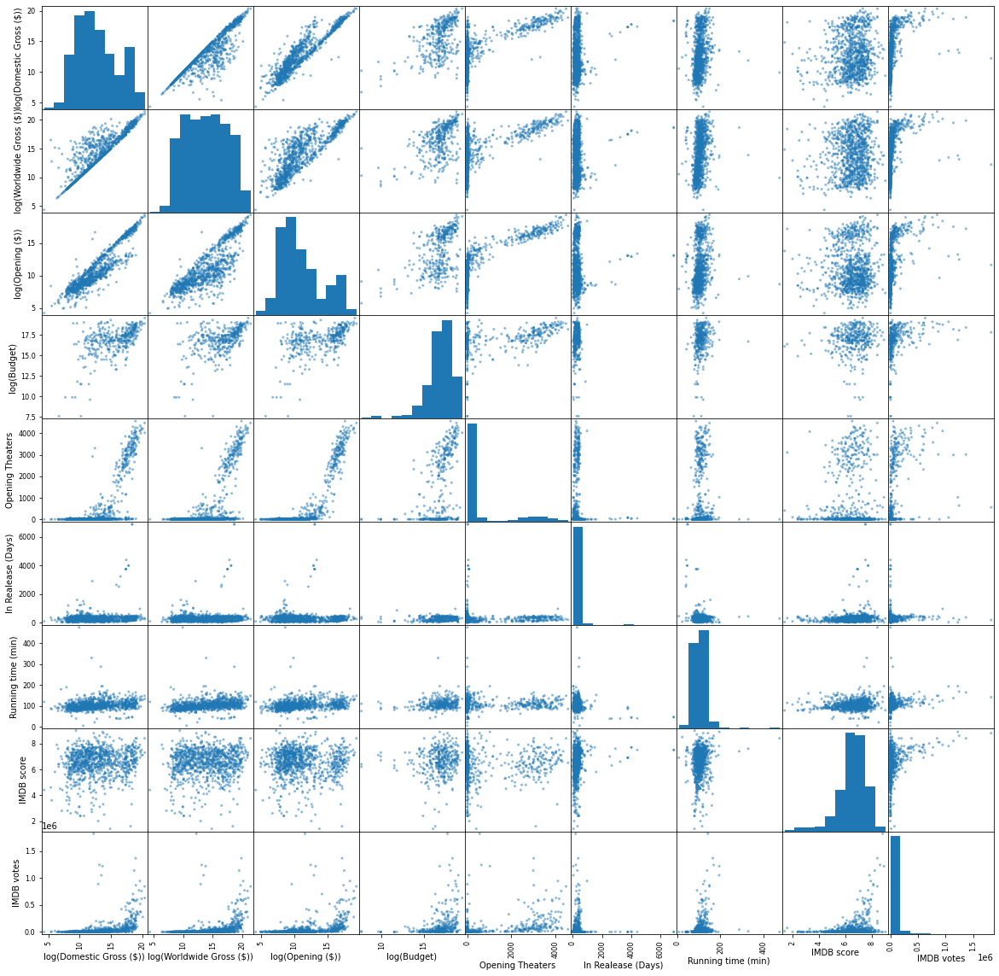

In [39]:
pd.plotting.scatter_matrix(sample, figsize=(20,20))
plt.savefig('matrix.pdf',bbox_inches='tight')
#plt.show()


In [40]:
grouped=meta.groupby('Language')
users_sorted_average =pd.DataFrame({col:vals['Worldwide Gross ($)'] for col,vals in grouped}).mean().sort_values(ascending=False)
users_sorted_average

American Sign Language    1.244870e+08
Chinese                   8.773341e+07
Mandarin                  7.716837e+07
Indonesian                6.206360e+07
English                   6.123345e+07
                              ...     
Zulu                      1.171000e+04
Burmese                   8.077000e+03
Dari                      7.919000e+03
Rhaetian                  6.719000e+03
Ukrainian                 3.909000e+03
Length: 84, dtype: float64

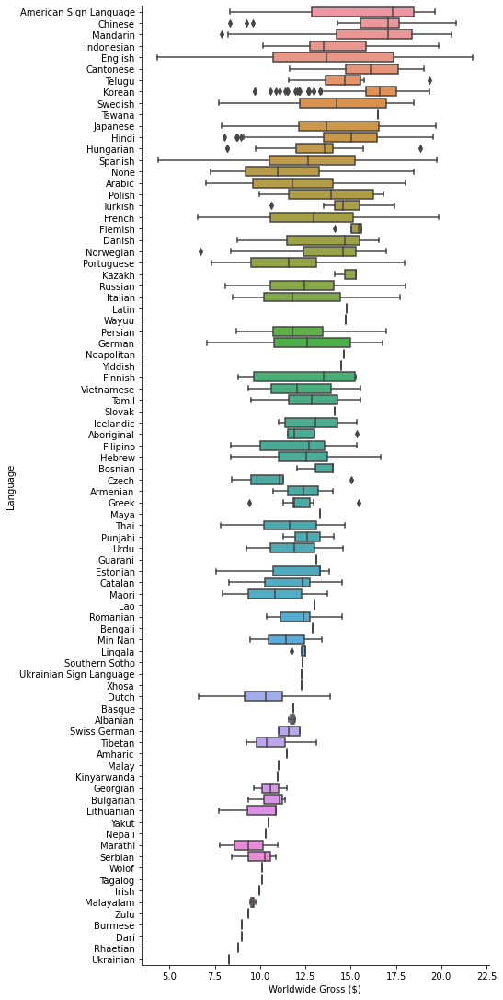

In [43]:
sns.catplot(x=np.log1p(meta['Worldwide Gross ($)']), y=meta.Language,data=meta,order=users_sorted_average.index,kind='box',height=15,aspect=1/2)
plt.savefig('box.pdf',bbox_inches='tight')

In [44]:
genres=[]
for i in meta.Genres.to_list():
   if type(i)!=float:
       genres.append(i.replace('\n','').split())
G=[]
for i in genres:
    for j in i:
        G.append(j)
G=sorted(list(set(G)))
D={}
for index,item in enumerate(G):
    v=np.zeros(len(G),dtype=int)
    v[index]=1
    D[item]=v
D

{'Action': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Adult': array([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Adventure': array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Animation': array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Biography': array([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Comedy': array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Crime': array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Documentary': array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Drama': array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0]),
 'Family': array([0, 0, 0, 0, 0, 0,

In [45]:
meta['Genres'].astype(object)
meta.Genres

0       Action\n    \n        Adventure\n    \n       ...
1       Adventure\n    \n        Animation\n    \n    ...
2       Adventure\n    \n        Family\n    \n       ...
3       Action\n    \n        Adventure\n    \n       ...
4       Action\n    \n        Adventure\n    \n       ...
                              ...                        
8398                                          Documentary
8399    Documentary\n    \n        Drama\n    \n      ...
8400                     Documentary\n    \n        Music
8401                                          Documentary
8402                        Horror\n    \n        Mystery
Name: Genres, Length: 8403, dtype: object

In [46]:
for index in meta.index:
    if type(meta.Genres[index])!=float:
        meta.at[index,'Genres']=meta.Genres[index].replace('\n','').split()

In [353]:
meta.Genres

0                    [Action, Adventure, Fantasy, Sci-Fi]
1         [Adventure, Animation, Comedy, Family, Fantasy]
2                            [Adventure, Family, Fantasy]
3                             [Action, Adventure, Sci-Fi]
4       [Action, Adventure, Drama, Fantasy, Romance, T...
                              ...                        
8398                                        [Documentary]
8399                            [Documentary, Drama, War]
8400                                 [Documentary, Music]
8401                                        [Documentary]
8402                                    [Horror, Mystery]
Name: Genres, Length: 8403, dtype: object

In [47]:
for index in meta.index:
    if type(meta.Genres[index])==list:
        v=0
        for item in meta.Genres[index]:
            v+=D[item]
        meta.at[index,'Genres']=v

In [355]:
meta.Genres

0       [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...
1       [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, ...
2       [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, ...
3       [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
4       [1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...
                              ...                        
8398    [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...
8399    [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, ...
8400    [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, ...
8401    [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...
8402    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...
Name: Genres, Length: 8403, dtype: object

In [48]:
meta.MPAA

0       PG-13
1         NaN
2          PG
3       PG-13
4       PG-13
        ...  
8398      NaN
8399      NaN
8400      NaN
8401      NaN
8402        R
Name: MPAA, Length: 8403, dtype: object

In [49]:
mpaa=[]
for i in meta.MPAA.to_list():
   if type(i)!=float:
       mpaa.append(i)


mpaa=sorted(list(set(mpaa)))
D={}
for index,item in enumerate(mpaa):
    v=np.zeros(len(mpaa),dtype=int)
    v[index]=1
    D[item]=v

In [50]:
D

{'G': array([1, 0, 0, 0, 0, 0, 0, 0, 0]),
 'M/PG': array([0, 1, 0, 0, 0, 0, 0, 0, 0]),
 'NC-17': array([0, 0, 1, 0, 0, 0, 0, 0, 0]),
 'Not Rated': array([0, 0, 0, 1, 0, 0, 0, 0, 0]),
 'PG': array([0, 0, 0, 0, 1, 0, 0, 0, 0]),
 'PG-13': array([0, 0, 0, 0, 0, 1, 0, 0, 0]),
 'R': array([0, 0, 0, 0, 0, 0, 1, 0, 0]),
 'TV-PG': array([0, 0, 0, 0, 0, 0, 0, 1, 0]),
 'Unrated': array([0, 0, 0, 0, 0, 0, 0, 0, 1])}

In [51]:
for index in meta.index:
    if type(meta.MPAA[index])!=float:
        v=0
        v+=D[meta.MPAA[index]]
    meta.at[index,'MPAA']=v

In [52]:
from wordcloud import WordCloud, STOPWORDS


In [53]:
a=''
for item in meta.title.values:
    if type(item)==str:
        a=a+' '+item

In [54]:
a=a.strip()

In [57]:
stopwords = set(STOPWORDS)
movie_wc = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords,
    
)

# generate the word cloud
movie_wc.generate(a)

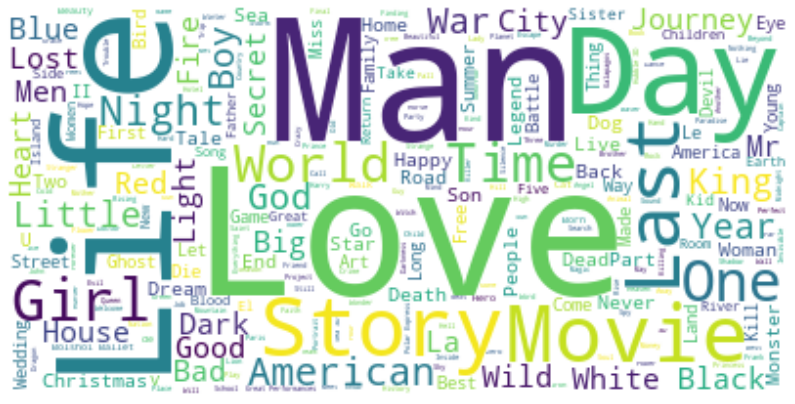

In [58]:
fig = plt.figure()
fig.set_figwidth(14) # set width
fig.set_figheight(18) # set height

# display the cloud
plt.imshow(movie_wc, interpolation='bilinear')
plt.axis('off')
plt.show()

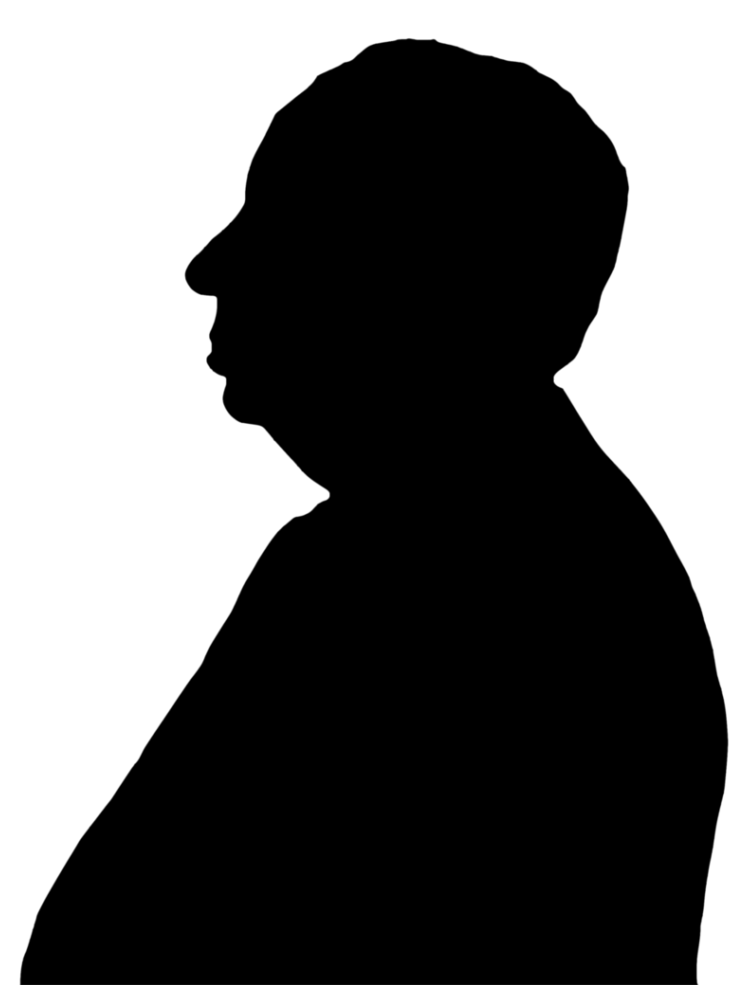

In [60]:
from PIL import Image
mo_mask = np.array(Image.open('C:\\Users\\alise\\Dropbox\\Programming\\Machine learning in physics\\Project\\Success in movies\\Phase 1\\Box Office Mojo\\mask.png'))

fig = plt.figure()
fig.set_figwidth(14) # set width
fig.set_figheight(18) # set height

plt.imshow(mo_mask, cmap=plt.cm.gray, interpolation='bilinear')
plt.axis('off')
plt.show()

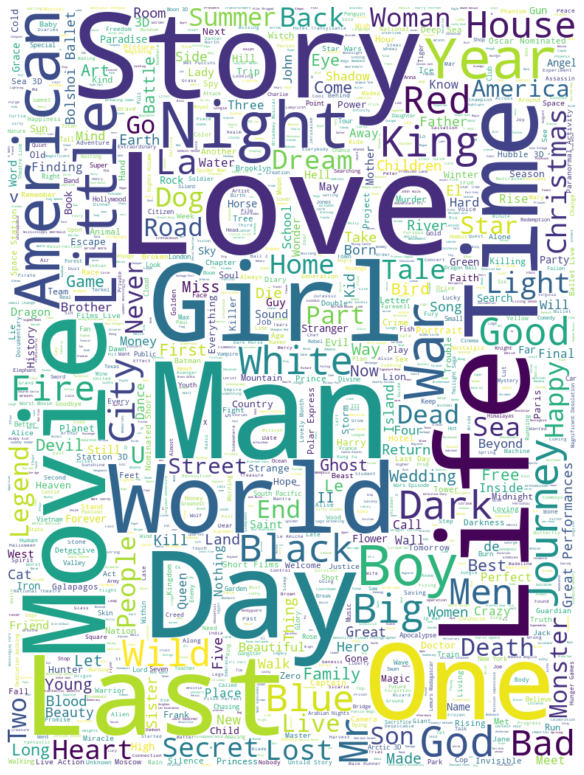

In [64]:
alice_mask = np.array(Image.open('C:\\Users\\alise\\Dropbox\\Programming\\Machine learning in physics\\Project\\Success in movies\\Phase 1\\Box Office Mojo\\mask.png'))
# instantiate a word cloud object
alice_wc = WordCloud(background_color='white', max_words=2000, mask=alice_mask, stopwords=stopwords)

# generate the word cloud
alice_wc.generate(a)

# display the word cloud
fig = plt.figure()
fig.set_figwidth(14) # set width
fig.set_figheight(14) # set height

plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')
plt.savefig('cload.pdf',bbox_inches='tight')
plt.show()

In [65]:
for index in meta.index:
    if type(meta.loc[index,'Release Date'])!=float:
        try:
            meta.loc[index,'Day']=int(meta.loc[index,'Release Date'].split()[1].replace(',',''))
            meta.loc[index,'Month']=meta.loc[index,'Release Date'].split()[0]
        except:
            meta.loc[index,'Day']=int(meta.loc[index,'Release Date'].split('-')[0])
            meta.loc[index,'Month']=meta.loc[index,'Release Date'].split('-')[1]

In [67]:
 order=meta.groupby('Month')['Worldwide Gross ($)'].sum().sort_values(ascending=False).index.values

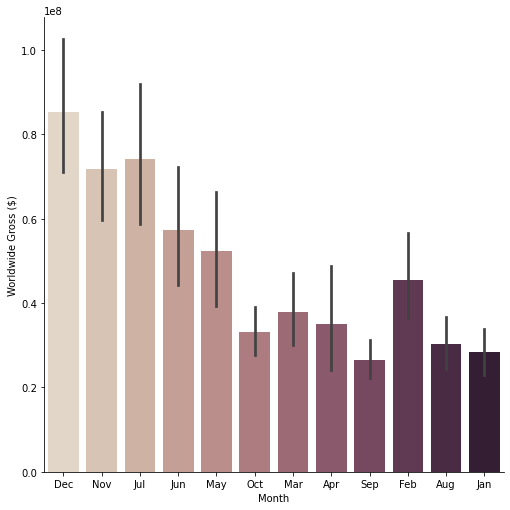

In [69]:
sns.catplot(x='Month',y='Worldwide Gross ($)',kind='bar',palette="ch:.25",data=meta,height=7,order=order)
plt.savefig('gross-month.pdf',bbox_inches='tight')

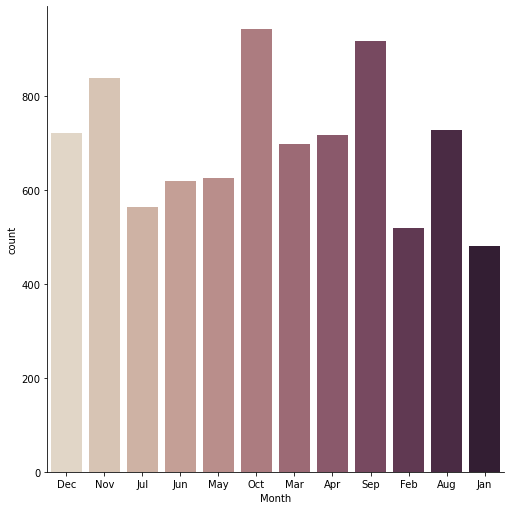

In [71]:
sns.catplot(x='Month',data=meta,kind='count',palette="ch:.25",height=7,order=order)
plt.savefig('month hist.pdf',bbox_inches='tight')

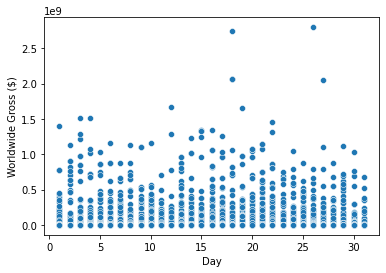

In [543]:
sns.scatterplot(x=meta['Day'],y=meta['Worldwide Gross ($)'],palette="ch:.25")

In [565]:
dirr=[]
for index in meta.index:
    if type(meta.loc[index,'Director(s)'])!=float:
        dirr.append(meta.loc[index,'Director(s)'].split('\n'))
        

In [576]:
dir_set=list(set([item.strip() for sublist in dirr for item in sublist]))

In [577]:
len(dir_set)

5662

' a '